In [ ]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import librosa
import keras
import os
import datetime
import soundfile as sf
import shutil
import pytz
import random
import numpy as np
from tqdm import tqdm
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras import backend
from tensorflow.keras.initializers import orthogonal
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler, TensorBoard
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
import traceback
import pandas as pd

import tensorflow as tf
import librosa.display
from keras.losses import *
import keras.metrics as mtcs
from google.colab import drive

import IPython.display as ipd

import matplotlib as mpl
import scipy


from keras import layers, Sequential

from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline
%load_ext tensorboard
#Mount drive folder
drive.mount('/content/drive')
fingerprints_folder= '/content/drive/MyDrive/fingerprints/immagini'
clean_path = '/content/drive/MyDrive/fingerprints/immagini/clean'
noisy_path = '/content/drive/MyDrive/fingerprints/immagini/noisy'
very_noisy_path = '/content/drive/MyDrive/fingerprints/immagini/deeply_noised'
mixed_path = '/content/drive/MyDrive/fingerprints/immagini/mixed_noise'
blurred_path = '/content/drive/MyDrive/fingerprints/immagini/blurred'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Mounted at /content/drive


In [ ]:
print("\nGPU Specs:")
!nvidia-smi


GPU Specs:
Sun Apr  7 17:22:03 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+-------------

In [ ]:
from PIL import Image
import cv2
from skimage.util import random_noise
from scipy.ndimage import gaussian_filter
from tensorflow.keras.preprocessing import image as kimage

In [ ]:
learning_rate = 0.001
altezza = 256
lunghezza = 256

target_shape = (256,256)
input_shape = (256,256,1)

#GENERIC TOOLS

In [ ]:
import os
import numpy as np
from skimage import io
from skimage.util import random_noise
from skimage.filters import gaussian

def apply_blur_noise_to_subfolders(pathA, pathB, sigma=1, noise_amount=0.50, show_before_saving=False):
    """
    Applica il blur e il noise alle immagini .tif nelle sottocartelle di pathA e salva in pathB mantenendo la struttura.
    Mostra le immagini prima di salvarle se show_before_saving è True.
    """
    subfolders = ['test', 'train', 'val']

    if not os.path.exists(pathB):
        os.makedirs(pathB)

    check = 0

    for subfolder in subfolders:
        current_pathA = os.path.join(pathA, subfolder)
        current_pathB = os.path.join(pathB, subfolder)

        if not os.path.exists(current_pathB):
            os.makedirs(current_pathB)

        images = [f for f in os.listdir(current_pathA) if f.endswith('.tif')]

        for img_name in images:

            img_path = os.path.join(current_pathA, img_name)
            img = io.imread(img_path)

            # Applica noise e blur
            noisy_img = random_noise(img, mode='s&p', amount=noise_amount)
            blurred_img = gaussian(noisy_img, sigma=sigma, multichannel=True)

            # Converte da float a uint8
            #noisy_img_uint8 = (255 * noisy_img).astype(np.uint8)
            blurred_img_uint8 = (255 * blurred_img).astype(np.uint8)

            # Mostra le immagini prima di salvarle
            '''if check == 0:
                check = 1
                plot_fp([img, blurred_img_uint8], ['Original', 'Blurred'])
                user_input = input("Vuoi salvare queste immagini? (y/n): ")
                if user_input.lower() != 'y':
                    return 0'''

            # Salva l'immagine
            save_path = os.path.join(current_pathB, img_name)
            io.imsave(save_path, blurred_img_uint8)

# Esempio di utilizzo
pathA = clean_path
pathB = mixed_path
#apply_blur_noise_to_subfolders(pathA, pathB, sigma = 4, noise_amount = 0.20)

In [ ]:
def copy_folder(source_path, base_destination_path):
    """
    Copia una cartella con tutti i suoi contenuti in una nuova cartella di destinazione.
    La cartella di destinazione avrà un nome che include la data e l'ora corrente.

    Args:
    - source_path (str): Il percorso della cartella sorgente.
    - base_destination_path (str): Il percorso base della cartella di destinazione,
                                   senza l'aggiunta di data e ora.
    """
    # Formatta la data e l'ora corrente
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    destination_folder_name = f"model_{timestamp}"
    destination_path = os.path.join(base_destination_path, destination_folder_name)

    # Verifica se il percorso sorgente esiste
    if not os.path.exists(source_path):
        print(f"Il percorso sorgente {source_path} non esiste.")
        return

    # Utilizza shutil.copytree per copiare la cartella, sovrascrivendo se la destinazione esiste (Python 3.8+)
    try:
        shutil.copytree(source_path, destination_path, dirs_exist_ok=True)  # Aggiunto dirs_exist_ok=True
        print(f"Cartella copiata con successo da {source_path} a {destination_path}")
    except shutil.Error as e:
        # Gestisce errori come file già esistenti nella destinazione
        print(f"Errore durante la copia della cartella: {e}")
    except OSError as e:
        # Gestisce errori come permessi insufficienti
        print(f"Errore di sistema operativo: {e}")

def create_fp_dataset(folder_path, test_size=0.2, validation_size=0.25, flag_testing = False, num_campioni = 200):
    """
    Create TensorFlow datasets from a folder of clean voice files with a duration check,
    splitting them into training and test sets.

    Args:
    - folder_path: Path to the folder containing voice files.
    - sr: Sample rate for librosa to load audio files.
    - target_duration: Minimum duration for voice files to be included in the datasets.
    - test_size: Proportion of the dataset to include in the test split.
    - validation_size: Proportion of the dataset to include in the validation split.
    - flag_testing: When true, the function creates a smaller version of the datasets for testing purposes
    - num_campioni: Number of samples considerated for testing purposes

    Returns:
    - train_dataset: TensorFlow dataset for training.
    - test_dataset: TensorFlow dataset for testing.
    - val_dataset: TensorFlow dataset for validation.
    """
    fp_paths = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.tif')]
    # Split the filtered paths into training and test sets
    filtered_paths = []
    count = 0
    for path in fp_paths:
        if flag_testing and count == num_campioni:
            break
        # print(str(path))
        #print(str(count+1) + ': '+ str(path))
        filtered_paths.append(path)
        count += 1

    # Split the filtered paths into training and test sets
    train_paths, temp_paths = train_test_split(filtered_paths, test_size=test_size, random_state=42)
    test_paths, validation_paths = train_test_split(temp_paths, test_size=validation_size, random_state=42)

    # Create TensorFlow datasets from the split file paths
    train_dataset = tf.data.Dataset.from_tensor_slices(train_paths)
    test_dataset = tf.data.Dataset.from_tensor_slices(test_paths)
    validation_dataset = tf.data.Dataset.from_tensor_slices(validation_paths)

    print('Train size: ' + str(len(train_dataset)))
    print('Test size: ' + str(len(test_dataset)))
    print('Validation size: ' + str(len(validation_dataset)))

    return train_dataset, validation_dataset, test_dataset

#**DATA PREPARATION**

##**Support Functions**

In [ ]:
def analyze_image_dimensions(folder_path):
    widths = []
    heights = []

    # Raccoglie le dimensioni di tutte le immagini nella cartella
    for file_name in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file_name)
        try:
            with Image.open(file_path) as img:
                width, height = img.size
                widths.append(width)
                heights.append(height)
        except IOError:
            continue  # Ignora i file che non sono immagini

    # Calcola statistiche
    widths = np.array(widths)
    heights = np.array(heights)
    median_width = np.median(widths)
    median_height = np.median(heights)
    percentile_90_width = np.percentile(widths, 90)
    percentile_90_height = np.percentile(heights, 90)

    # Stampa statistiche
    print(f"Mediana Lunghezza: {median_width}, Mediana altezza: {median_height}")
    print(f"90° Percentile Lunghezza: {percentile_90_width}, 90° Percentile altezza: {percentile_90_height}")

    unique_widths, counts_widths = np.unique(widths, return_counts=True)
    unique_heights, counts_heights = np.unique(heights, return_counts=True)

    # Plot distribuzione per Lunghezza
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plt.bar(unique_widths, counts_widths, color='skyblue')
    plt.title('Distribuzione Lunghezza')
    plt.xlabel('Lunghezza')
    plt.ylabel('Numero di Campioni')

    # Plot distribuzione per altezza
    plt.subplot(1, 2, 2)
    plt.bar(unique_heights, counts_heights, color='lightgreen')
    plt.title('Distribuzione Altezza')
    plt.xlabel('Altezza')
    plt.ylabel('Numero di Campioni')

    plt.tight_layout()
    plt.show()

    return median_width, median_height, percentile_90_width, percentile_90_height

In [ ]:
def plot_fp(img=[], name=[], titolo=None, save_path=None, max_righe= 3, titolo_fontsize=16):
    n = len(img)
    if n == len(name):
        # Calcola il numero di righe e colonne per la griglia di subplot
        nrows = n // max_righe + (n % max_righe > 0)  # Aggiungi una riga se ci sono immagini residue
        ncols = min(n, max_righe)  # Massimo 3 colonne

        fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 6*nrows))
        fig.tight_layout(pad=3.0)  # Aggiusta lo spazio tra i subplot

        if titolo:  # Imposta il titolo generale se fornito
            plt.suptitle(titolo, fontsize=titolo_fontsize, y=1.05)

        # Renderizza ogni immagine nella sua posizione nella griglia di subplot
        for i in range(n):
            r = i // max_righe  # Indice della riga
            c = i % max_righe   # Indice della colonna
            if n > max_righe:
                ax = axes[r, c]
            else:
                ax = axes[i] if nrows == 1 else axes[r]

            ax.imshow(img[i], cmap='gray')
            ax.set_title(name[i], fontsize = 20)
            ax.axis('off')

        # Nascondi gli assi vuoti se il numero di immagini non riempie l'ultima riga
        if n % max_righe != 0:
            for j in range(n, nrows*max_righe):
                axes.flatten()[j].axis('off')

        if save_path:  # Salva la figura se è stato fornito un percorso di salvataggio
            plt.savefig(save_path, bbox_inches='tight')  # bbox_inches='tight' per non tagliare il titolo
            print(f"Immagine salvata in {save_path}")

        plt.show()
    else:
        print('Inserisci lo stesso numero di immagini e nomi')

In [ ]:
from skimage import exposure
from skimage.util import random_noise
from scipy.ndimage import gaussian_filter
from tensorflow.keras.preprocessing import image as kimage

def normalize_contrast(img_array):
    """Normalizza l'immagine per avere pixel nel range 0-255."""
    img_min, img_max = img_array.min(), img_array.max()
    img_contrast = (img_array - img_min) / (img_max - img_min) * 255
    return img_contrast.astype(np.uint8)

def visualize_mix_fp_noise_results(path = fingerprints_folder, salt_pepper_ratio=0.5, amount=0.04, blur_value=1, num_rois=3, roi_size=(50, 50)):
    while True:
        fp_path = random.choice([f for f in os.listdir(path) if f.endswith('.tif')])
        fp_path = os.path.join(path, fp_path)

        #Ottieni spettrogrammi misti e puliti utilizzando la funzione mix_voice_noise
        try:
            img_normalized, blurred_img, salted, noisy_img = mix_fp_noise_with_random_local_blur(fp_path, salt_pepper_ratio, amount, blur_value, num_rois, roi_size, mode = 'ALL')
            break
        except:
            pass
    img_normalized=preprocess_image(img_normalized)
    blurred_img=preprocess_image(blurred_img)
    salted=preprocess_image(salted)
    noisy_img=preprocess_image(noisy_img)
    plot_fp(img=[img_normalized,salted,blurred_img,noisy_img], name = ['Normalized Contrast Image', 'Image with SAP','Image with blur','Image with SAP and Blur'])
    # Mostra le immagini
    '''fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img_normalized, cmap='gray')
    axes[0].set_title('Normalized Contrast Image')
    axes[0].axis('off')

    axes[1].imshow(noisy_img, cmap='gray')
    axes[1].set_title('Image with Noise')
    axes[1].axis('off')

    axes[2].imshow(blurred_noisy_img, cmap='gray')
    axes[2].set_title('Image with Noise and Blur')
    axes[2].axis('off')

    plt.show()'''

    import tensorflow as tf
from skimage.util import random_noise
from scipy.ndimage import gaussian_filter
from tensorflow.keras.preprocessing import image as kimage

def preprocess_image(image_array, target_height=altezza, target_width=lunghezza):
    # Ensure the image has 3 dimensions
    if image_array.ndim == 2:
        image_array = tf.expand_dims(image_array, axis=-1)

    # Calculate the starting point for the crop
    shape = tf.shape(image_array)
    start_height = (shape[0] - target_height) // 2
    start_width = (shape[1] - target_width) // 2

    # Perform the image cropping
    image_cropped = tf.image.crop_to_bounding_box(
        image_array,
        start_height,
        start_width,
        target_height,
        target_width
    )

    # Convert image to float32 before normalization
    image_cropped = tf.cast(image_cropped, tf.float32)

    # Normalize the pixel values
    return image_cropped / 255.0


In [ ]:
from skimage.util import random_noise
from scipy.ndimage import gaussian_filter
from tensorflow.keras.preprocessing import image as kimage

def select_random_rois(img_shape, num_rois=3, roi_size=(50, 50)):
    h, w = img_shape
    rois = []
    for _ in range(num_rois):
        # Calcola il centro dell'immagine
        cx, cy = w // 2, h // 2
        # Seleziona casualmente il centro della ROI vicino al centro dell'immagine
        roi_cx = np.random.randint(cx - w // 4, cx + w // 4)
        roi_cy = np.random.randint(cy - h // 4, cy + h // 4)
        # Calcola le coordinate dell'angolo superiore sinistro della ROI
        x = max(roi_cx - roi_size[0] // 2, 0)
        y = max(roi_cy - roi_size[1] // 2, 0)
        # Assicurati che la ROI non ecceda i limiti dell'immagine
        x = min(x, w - roi_size[0])
        y = min(y, h - roi_size[1])
        rois.append((x, y, roi_size[0], roi_size[1]))
    return rois

def mix_fp_noise_with_random_local_blur(path, salt_pepper_ratio=0.5, amount=0.04, blur_value=1, num_rois=3, roi_size=(50, 50), mode = 'ALL'):
    # Carica l'immagine in scala di grigio
    img = kimage.load_img(path, color_mode='grayscale')
    img_array = kimage.img_to_array(img).squeeze()  # Rimuove l'asse dei colori per lavorare con 2D array

    # Normalizza il contrasto dell'immagine
    img_normalized = normalize_contrast(img_array)

    if mode != 'BLUR':
    # Applica il rumore Salt and Pepper
        salted_img = random_noise(img_normalized, mode='s&p', salt_vs_pepper=salt_pepper_ratio, amount=amount)
        #salted_img = (255 * salted_img).astype(np.uint8)  # Converti l'immagine rumorosa in uint8
    if mode != 'SAP':
        rois = select_random_rois(salted_img.shape, num_rois=num_rois, roi_size=roi_size)

        blurred_local_img = img_normalized.copy()
        for (x, y, w, h) in rois:
            roi = blurred_local_img[y:y+h, x:x+w]
            blurred_roi = gaussian_filter(roi, sigma=blur_value)
            blurred_local_img[y:y+h, x:x+w] = blurred_roi

        if mode == 'BLUR':
            return img_normalized, blurred_local_img

        blurred_salted_local_img = salted_img.copy()
        for (x, y, w, h) in rois:
            roi1 = blurred_salted_local_img[y:y+h, x:x+w]
            blurred_roi1 = gaussian_filter(roi1, sigma=blur_value)
            blurred_salted_local_img[y:y+h, x:x+w] = blurred_roi1

        if mode == 'MIX':
            return img_normalized, blurred_salted_local_img
    else:
        return img_normalized, salted_img

    return img_normalized, blurred_local_img, salted_img, blurred_salted_local_img

##main misc

In [ ]:
pepper = 0.5
pepper_amount = 0.2
blur_value = 2
rois_amount = 5

#**TRAINING PROCEDURES**

In [ ]:
from tensorflow.keras.utils import Sequence
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from PIL import Image

class FingerprintDataGenerator(Sequence):
    def __init__(self, clean_images_dir, noised_images_dir, batch_size, crop_size=(altezza, lunghezza)):
        self.clean_images_dir = clean_images_dir
        self.noised_images_dir = noised_images_dir
        self.batch_size = batch_size
        self.crop_size = crop_size
        self.image_filenames = [f for f in os.listdir(clean_images_dir) if os.path.isfile(os.path.join(clean_images_dir, f))]
        random.shuffle(self.image_filenames)

    def __len__(self):
        return len(self.image_filenames) // self.batch_size

    def __getitem__(self, idx):
        batch_filenames = self.image_filenames[idx * self.batch_size:(idx + 1) * self.batch_size]

        batch_x = np.zeros((self.batch_size,) + self.crop_size + (1,), dtype=np.float32)
        batch_y = np.zeros((self.batch_size,) + self.crop_size + (1,), dtype=np.float32)

        for i, filename in enumerate(batch_filenames):
            clean_path = os.path.join(self.clean_images_dir, filename)
            noised_path = os.path.join(self.noised_images_dir, filename)

            clean_img = Image.open(clean_path).convert('L')
            noised_img = Image.open(noised_path).convert('L')

            # Cropping
            clean_img = self.crop_center(clean_img, self.crop_size[0], self.crop_size[1])
            noised_img = self.crop_center(noised_img, self.crop_size[0], self.crop_size[1])

            # Convert to numpy array and normalize
            batch_x[i] = np.expand_dims(np.array(noised_img) / 255.0, axis=-1)
            batch_y[i] = np.expand_dims(np.array(clean_img) / 255.0, axis=-1)
        return batch_x, batch_y

    def crop_center(self, img, cropx, cropy):
        img_width, img_height = img.size
        startx = img_width//2 - cropx//2
        starty = img_height//2 - cropy//2
        return img.crop((startx, starty, startx+cropx, starty+cropy))


In [ ]:
import tensorflow as tf
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.image import ssim

@tf.keras.saving.register_keras_serializable()
def psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

@tf.keras.saving.register_keras_serializable()
def ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

In [ ]:
'''import os
import shutil
from sklearn.model_selection import train_test_split

def distribute_files(pathA, pathB):
    # Crea le sottocartelle se non esistono
    for path in [pathA, pathB]:
        for subdir in ['train', 'test', 'val']:
            os.makedirs(os.path.join(path, subdir), exist_ok=True)

    # Ottiene la lista dei file (assumendo che i nomi dei file siano identici tra pathA e pathB)
    files = [f for f in os.listdir(pathA) if os.path.isfile(os.path.join(pathA, f))]

    # Divide i file in train, val e test
    train_files, test_files = train_test_split(files, test_size=0.25, random_state=42)  # 75% train, 25% restante
    test_files, val_files = train_test_split(test_files, test_size=0.6, random_state=42)  # 15% val, 10% test dal restante 25%

    # Funzione per spostare i file
    def move_files(files, sourceA, sourceB, destinationA, destinationB):
        for f in files:
            shutil.move(os.path.join(sourceA, f), os.path.join(destinationA, f))
            shutil.move(os.path.join(sourceB, f), os.path.join(destinationB, f))

    # Sposta i file nelle sottocartelle appropriate
    move_files(train_files, pathA, pathB, os.path.join(pathA, 'train'), os.path.join(pathB, 'train'))
    move_files(test_files, pathA, pathB, os.path.join(pathA, 'test'), os.path.join(pathB, 'test'))
    move_files(val_files, pathA, pathB, os.path.join(pathA, 'val'), os.path.join(pathB, 'val'))


distribute_files(clean_path, noisy_path)

'''

"import os\nimport shutil\nfrom sklearn.model_selection import train_test_split\n\ndef distribute_files(pathA, pathB):\n    # Crea le sottocartelle se non esistono\n    for path in [pathA, pathB]:\n        for subdir in ['train', 'test', 'val']:\n            os.makedirs(os.path.join(path, subdir), exist_ok=True)\n\n    # Ottiene la lista dei file (assumendo che i nomi dei file siano identici tra pathA e pathB)\n    files = [f for f in os.listdir(pathA) if os.path.isfile(os.path.join(pathA, f))]\n\n    # Divide i file in train, val e test\n    train_files, test_files = train_test_split(files, test_size=0.25, random_state=42)  # 75% train, 25% restante\n    test_files, val_files = train_test_split(test_files, test_size=0.6, random_state=42)  # 15% val, 10% test dal restante 25%\n\n    # Funzione per spostare i file\n    def move_files(files, sourceA, sourceB, destinationA, destinationB):\n        for f in files:\n            shutil.move(os.path.join(sourceA, f), os.path.join(destinationA

In [ ]:
def execute_training_procedure(model, model_name, noisy_folder = noisy_path, epochs=100, batch_size=16, flag_testing = False, num_samples = 200, divide = False, path_save_finals = '/content/drive/MyDrive/fingerprints/final_models'):
    # Callbacks
    callbacks_path = '/content/drive/MyDrive/fingerprints/training'

    timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    destination_folder_name = f"{model_name}_{timestamp}"
    destination_path = os.path.join(callbacks_path, destination_folder_name)

    logs_path_save = os.path.join(destination_path, 'logs')
    os.mkdir(destination_path)
    os.mkdir(logs_path_save)

    print(f'Path di destinazione: {str(destination_path)}')
    test_clean_path = os.path.join(clean_path, 'test')
    val_clean_path = os.path.join(clean_path, 'val')
    train_clean_path = os.path.join(clean_path, 'train')
    test_noisy_path = os.path.join(noisy_folder, 'test')
    val_noisy_path = os.path.join(noisy_folder, 'val')
    train_noisy_path = os.path.join(noisy_folder, 'train')
    data_generator = FingerprintDataGenerator(train_clean_path, train_noisy_path, batch_size=batch_size, divide = divide)
    val_generator = FingerprintDataGenerator(val_clean_path, val_noisy_path, batch_size=batch_size, divide = divide)
    test_generator = FingerprintDataGenerator(test_clean_path,test_noisy_path, batch_size = batch_size, divide = divide)
    v_callbacks=[
        keras.callbacks.ModelCheckpoint(os.path.join(destination_path, 'model_checkpoint.keras'), save_best_only=True),
        keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=10, verbose=1, mode='min'),
        keras.callbacks.TensorBoard(log_dir=logs_path_save),
        keras.callbacks.ReduceLROnPlateau(monitor='val_loss', min_delta=3e-5, factor=0.1, patience=5, min_lr=1e-5, verbose=1, mode='min',cooldown=2)
    ]

    model.fit(data_generator, epochs=epochs, validation_data=val_generator, verbose = 1, callbacks = v_callbacks)

    # Valutazione del modello
    print("Evaluating model...")
    model.evaluate(test_generator, verbose = 1, callbacks = v_callbacks)

    path_model_s = os.path.join(path_save_finals, model_name)
    model.save(path_model_s)

##V2

#**MODELS**

##ARCHITECTURES 3.0

In [ ]:
!pip install numba

In [ ]:
'''from numba import cuda
device = cuda.get_current_device()
device.reset()'''

In [ ]:
'''def wdsr_b(scale, num_filters=32, num_res_blocks=8, res_block_expansion=6, input_shape=(256, 256, 1)):
    """
    Costruisce il modello WDSR-B per il super-risoluzione.

    Parametri:
    - scale: fattore di scala per il super-risoluzione (e.g., 2, 4)
    - num_filters: numero di filtri nei layer convoluzionali
    - num_res_blocks: numero di blocchi residui
    - res_block_expansion: fattore di espansione all'interno dei blocchi residui
    - input_shape: forma dell'input dell'immagine
    """

    # Funzione per un singolo blocco residuo
    def res_block(x_in):
        x = layers.Conv2D(num_filters * res_block_expansion, kernel_size=3, padding='same')(x_in)
        x = layers.Activation('relu')(x)
        x = layers.Conv2D(num_filters, kernel_size=3, padding='same')(x)
        x = layers.Add()([x_in, x])
        return x

    # Input Layer
    inputs = keras.Input(shape=input_shape)

    # Pre-expansion convolution
    x = layers.Conv2D(num_filters, kernel_size=3, padding='same')(inputs)

    # Residual blocks
    for _ in range(num_res_blocks):
        x = res_block(x)

    # Upscaling
    x = layers.Conv2D(num_filters * (scale ** 2), kernel_size=3, padding='same')(x)
    if scale > 1:
        x = tf.nn.depth_to_space(x, block_size=scale)

    # Output layer
    outputs = layers.Conv2D(1, kernel_size=3, padding='same')(x)

    # Create model
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer=AdamW(learning_rate = learning_rate), loss='mse', metrics =[psnr,ssim])

    return model

# Costruisci il modello WDSR-B
scale = 1  # Esempio: fattore di scala 2x
wdsr_b_model = wdsr_b(scale=scale)
wdsr_b_model.summary()
'''

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_113 (Conv2D)         (None, 256, 256, 32)         320       ['input_7[0][0]']             
                                                                                                  
 conv2d_114 (Conv2D)         (None, 256, 256, 192)        55488     ['conv2d_113[0][0]']          
                                                                                                  
 activation_48 (Activation)  (None, 256, 256, 192)        0         ['conv2d_114[0][0]']          
                                                                                            

In [ ]:
def DeepDenoisingAutoencoder(input_shape, n_filters):
    inputs = Input(shape=input_shape)

    # Encoder
    x = layers.Conv2D(filters=n_filters, kernel_size=3, strides=2, activation='relu', padding='same')(inputs)
    x = layers.Conv2D(filters=n_filters*2, kernel_size=3, strides=2, activation='relu', padding='same')(x)

    # Bottleneck
    x = layers.Conv2D(filters=n_filters*4, kernel_size=3, activation='relu', padding='same')(x)

    # Decoder
    x = layers.Conv2DTranspose(filters=n_filters*2, kernel_size=3, strides=2, activation='relu', padding='same')(x)
    x = layers.Conv2DTranspose(filters=n_filters, kernel_size=3, strides=2, activation='relu', padding='same')(x)

    # Output layer with sigmoid activation to ensure output values are between 0 and 1
    outputs = layers.Conv2D(filters=1, kernel_size=3, activation='sigmoid', padding='same')(x)

    # Modello
    model = Model(inputs=inputs, outputs=outputs)

    # Compilazione
    model.compile(optimizer=AdamW(learning_rate = learning_rate), loss='mse', metrics =[psnr,ssim])

    return model

# Parametri
input_shape = (256, 256, 1)  # Shape dell'input
n_filters = 64  # Numero di filtri nel primo strato convoluzionale

# Creazione del modello
deep_denoising_autoencoder1 = DeepDenoisingAutoencoder(input_shape, n_filters)
deep_denoising_autoencoder1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 64)      640       
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 256)       295168    
                                                                 
 conv2d_transpose (Conv2DTr  (None, 128, 128, 128)     295040    
 anspose)                                                        
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 256, 256, 64)      73792     
 Transpose)                                                  

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

def dense_block(filters, kernel_size, C):
    def block(x):
        concatenated_features = x
        for _ in range(C):
            out = layers.Conv2D(filters, kernel_size, padding='same', activation='relu')(concatenated_features)
            concatenated_features = layers.Concatenate()([concatenated_features, out])
        # Local Feature Fusion
        out = layers.Conv2D(filters, kernel_size, padding='same', activation='relu')(concatenated_features)
        # Residual Connection
        out = layers.Add()([x, out])
        return out
    return block

def RDN(D, C, G, G0, kernel_size, scale, c_dim, input_shape =(256,256,1)):
    inputs = keras.Input(shape=input_shape)
    sfe1 = layers.Conv2D(G0, kernel_size, padding='same', activation='relu')(inputs)
    sfe2 = layers.Conv2D(G, kernel_size, padding='same', activation='relu')(sfe1)
    x = sfe2
    for _ in range(D):
        x = dense_block(G, kernel_size, C)(x)
    # Global Feature Fusion
    x = layers.Conv2D(G0, 1, padding='same', activation='relu')(x)
    x = layers.Add()([x, sfe1])
    for _ in range(scale):
        x = layers.Conv2DTranspose(G0, kernel_size, strides=scale, padding='same')(x)
    output = layers.Conv2D(c_dim, kernel_size, padding='same')(x)
    model = keras.Model(inputs=inputs, outputs=output)
    return model

def build_rdn(image_size, c_dim, scale, D=5, C=3, G=16, G0=64, kernel_size=3):
    model = RDN(D=D, C=C, G=G, G0=G0, kernel_size=kernel_size, scale=scale, c_dim=c_dim)
    model.build(input_shape=(None, *image_size, c_dim))
    model.compile(optimizer=AdamW(learning_rate = learning_rate), loss='mse', metrics =[psnr,ssim])
    return model

In [ ]:
'''import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

def ResidualDenseBlock(filters, kernel_size, C):
    def block(x):
        for _ in range(C):
            out = layers.Conv2D(filters, kernel_size, padding='same', activation='relu')(x)
            x = layers.Concatenate()([x, out])
        return x
    return block

def RDN(D, C, G, G0, kernel_size, scale, c_dim, input_shape = input_shape):
    inputs = keras.Input(shape=input_shape)
    sfe1 = layers.Conv2D(G0, kernel_size, padding='same', activation='relu')(inputs)
    sfe2 = layers.Conv2D(G, kernel_size, padding='same', activation='relu')(sfe1)
    x = sfe2
    for _ in range(D):
        x = ResidualDenseBlock(G, kernel_size, C)(x)
    x = layers.Conv2D(G0, 1, padding='same', activation='relu')(x)
    x = layers.Add()([x, sfe1])
    for _ in range(scale):
        x = layers.Conv2DTranspose(G0, kernel_size, strides=scale, padding='same')(x)
    output = layers.Conv2D(c_dim, kernel_size, padding='same')(x)
    model = keras.Model(inputs=inputs, outputs=output)
    return model

def build_rdn(image_size, c_dim, scale, D=5, C=3, G=16, G0=64, kernel_size=3):
    model = RDN(D=D, C=C, G=G, G0=G0, kernel_size=kernel_size, scale=scale, c_dim=c_dim)
    model.build(input_shape=(None, *image_size, c_dim))
    model.compile(optimizer=AdamW(learning_rate = learning_rate), loss='mse', metrics =[psnr,ssim])
    return model'''

# Esempio di costruzione del modello
image_size = (256, 256)  # Sostituisci con le dimensioni reali delle immagini
c_dim = 1  # Canali dell'immagine (es. 3 per RGB)
scale = 0  # Fattore di scala per il super-risoluzione
rdn_model = build_rdn(image_size, c_dim, scale)
rdn_model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         640       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 16)         9232      ['conv2d[0][0]']              
                                                                                                  
 conv2d_2 (Conv2D)           (None, 256, 256, 16)         2320      ['conv2d_1[0][0]']            
                                                                                              

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Input
from tensorflow.keras.layers import Conv2D, Activation,BatchNormalization, Add
import numpy as np

@keras.saving.register_keras_serializable()
class SeConv_block(keras.layers.Layer):
    def __init__(self, kernel_size, input_channels, **kwargs):
        super(SeConv_block, self).__init__()
        self.kernel_size = kernel_size
        self.input_channels = input_channels


    def build(self, input_shape):
        kernel_init = tf.ones_initializer()
        self.kernel = tf.Variable(name="kernel", initial_value=kernel_init(shape=(self.kernel_size, self.kernel_size, self.input_channels, 1), dtype='float32'),trainable=True)


    def call(self, inputs):
        # non-noisy pixels map:
        M_hat = tf.math.not_equal(inputs, 0)
        M_hat = tf.dtypes.cast(M_hat, tf.float32)


        conv_input = tf.nn.conv2d(inputs, self.kernel, strides=[1, 1, 1, 1], padding='SAME', data_format='NHWC', dilations=None, name=None)
        conv_M_hat = tf.nn.conv2d(M_hat, self.kernel, strides=[1, 1, 1, 1], padding='SAME', data_format='NHWC', dilations=None, name=None)

        # find 0 in conv_M_hat and change to 1:
        is_zero_conv_M_hat = tf.equal(conv_M_hat, 0)
        is_zero_conv_M_hat = tf.dtypes.cast(is_zero_conv_M_hat, tf.float32)
        change_zero_to_one_conv_M_hat = tf.math.add(conv_M_hat, is_zero_conv_M_hat)

        S = tf.math.divide(conv_input, change_zero_to_one_conv_M_hat)


        # noisy pixels map:
        M = 1 - M_hat

        # calculate R:
        kernel_ones = np.ones((self.kernel_size, self.kernel_size, self.input_channels, 1))
        kernel_ones = tf.constant(kernel_ones, dtype=tf.float32)

        R = tf.nn.conv2d(M_hat, kernel_ones, strides=[1, 1, 1, 1], padding='SAME', data_format='NHWC', dilations=None, name=None)
        R = tf.math.greater_equal(R, tf.constant(self.kernel_size-2, dtype=tf.float32))
        R = tf.dtypes.cast(R, tf.float32)

        y = tf.math.multiply(tf.math.multiply(S, M), R) + inputs

        return y

    def get_config(self):
        config = super(SeConv_block, self).get_config()
        config.update({"kernel_size": self.kernel_size})
        return config


#___________________________________________________________________


# define model:
def SeConvNet(input_shape = input_shape, num_SeConv_block=7,depth=27,filters=64,image_channels=1):
  layer_count = 0
  inputs = Input(shape=input_shape, name='input'+str(layer_count))

  # 1st to 7th layers (SeConv_block):
  x = inputs
  for i in range(num_SeConv_block):
      layer_count += 1
      x = SeConv_block(2*layer_count+1, image_channels, name='SeConv_block'+str(layer_count))(x)


  # 8th to 26th layers, Conv+BN+ReLU:
  for i in range(depth-num_SeConv_block-1):
       layer_count += 1
       x = Conv2D(filters=filters, kernel_size=(3,3), strides=(1,1), kernel_initializer='Orthogonal', padding='same', use_bias = False, name='Conv'+str(layer_count))(x)
       x = BatchNormalization(axis=3, momentum=0.1, epsilon=0.0001, name='BN'+str(layer_count))(x)
       x = Activation('relu', name='ReLU'+str(layer_count))(x)


  # last layer, Conv:
  layer_count =+ 1
  x = Conv2D(filters=image_channels, kernel_size=(3,3), strides=(1,1), kernel_initializer='Orthogonal', padding='same', use_bias = False, name='Conv'+str(layer_count))(x)


  x =  keras.layers.Multiply(name='Multiply')([x, tf.dtypes.cast(tf.math.equal(inputs, 0), tf.float32)])

  outputs = Add(name='Add')([x, inputs])

  model = keras.models.Model(inputs=inputs, outputs=outputs)
  #model.compile(optimizer=AdamW(learning_rate = learning_rate), loss='mse', metrics =[psnr,ssim])
  model.compile(optimizer=AdamW(learning_rate = learning_rate), loss='mse', metrics =[psnr,ssim])
  model.summary()
  return model


SeConvNet = SeConvNet()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input0 (InputLayer)         [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 se_conv_block (SeConv_bloc  (None, 256, 256, 1)          9         ['input0[0][0]']              
 k)                                                                                               
                                                                                                  
 se_conv_block_1 (SeConv_bl  (None, 256, 256, 1)          25        ['se_conv_block[0][0]']       
 ock)                                                                                             
                                                                                              

In [ ]:
'''import os
import numpy as np
import skimage.io as io
import skimage.transform as trans
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, Add, Lambda, PReLU
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras import backend as K

n_init_features = 64

def find_medians(x, k=3):
    patches = tf.image.extract_patches(
            images=x,
            sizes=[1, k, k, 1],
            strides=[1, 1, 1, 1],
            rates=[1, 1, 1, 1],
            padding='SAME')
    m_idx = k*k//2 + 1
    top, _ = tf.nn.top_k(patches, m_idx, sorted=True)
    median = tf.slice(top, [0, 0, 0, m_idx-1], [-1, -1, -1, 1])
    return median

def median_pool2d(x, k=3):
    # La funzione ora lavora direttamente sull'input completo
    return find_medians(x, k)

def fully_conv(pretrained_weights=None, input_size=(256, 256, 1)):  # Adjusted for grayscale input
    def _residual_block(inputs, feature_dim=64):
        x = Conv2D(feature_dim, (3, 3), padding="same", kernel_initializer="he_normal")(inputs)
        x = BatchNormalization()(x)
        x = PReLU(shared_axes=[1, 2])(x)
        x = Conv2D(feature_dim, (3, 3), padding="same", kernel_initializer="he_normal")(x)
        x = BatchNormalization()(x)
        m = Add()([x, inputs])
        return m

    input_img = Input(shape=input_size, name='input_image')
    x5 = Lambda(median_pool2d, arguments={'k': 3})(input_img)
    x5 = Lambda(median_pool2d, arguments={'k': 3})(x5)
    x = x5
    x = Conv2D(n_init_features, (3, 3), padding="same", kernel_initializer="he_normal")(x)
    x = PReLU(shared_axes=[1, 2])(x)

    for i in range(8):
        x = _residual_block(x, feature_dim=n_init_features)
        if i < 1:
            x = Lambda(median_pool2d, arguments={'k': 3})(x)
    x = Conv2D(1, (3, 3), kernel_initializer='Orthogonal', padding='same')(x)  # Adjusted for grayscale output

    model = Model(inputs=input_img, outputs=x)
    model.compile(optimizer=AdamW(learning_rate = learning_rate), loss='mse', metrics =[psnr,ssim])
    model.summary()
    if pretrained_weights:
        model.load_weights(pretrained_weights)

    return model

MedianCNN = fully_conv()
'''

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 lambda (Lambda)             (None, 256, 256, 1)          0         ['input_image[0][0]']         
                                                                                                  
 lambda_1 (Lambda)           (None, 256, 256, 1)          0         ['lambda[0][0]']              
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         640       ['lambda_1[0][0]']            
                                                                                              

In [ ]:
def conv2d_block(input_tensor, n_filters, kernel_size=3):
    """Funzione per aggiungere 2 layer convoluzionali con le opzioni di normalizzazione e attivazione"""
    x = input_tensor
    for i in range(2):
        x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="Orthogonal", padding="same")(x)
        x = Activation("relu")(x)
    return x

def denoising_unet(input_img_shape=(256, 256, 1), n_filters=32):
    inputs = Input(input_img_shape)
    # Encoder
    c1 = conv2d_block(inputs, n_filters=n_filters*1, kernel_size=3)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    c2 = conv2d_block(p1, n_filters=n_filters*2, kernel_size=3)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    # Bottleneck
    bn = conv2d_block(p2, n_filters=n_filters*4, kernel_size=3)

    # Decoder
    u1 = layers.Conv2DTranspose(n_filters*2, (3, 3), strides=(2, 2), padding='same')(bn)
    u1 = layers.concatenate([u1, c2])
    c3 = conv2d_block(u1, n_filters=n_filters*2, kernel_size=3)
    u2 = layers.Conv2DTranspose(n_filters*1, (3, 3), strides=(2, 2), padding='same')(c3)
    u2 = layers.concatenate([u2, c1])
    c4 = conv2d_block(u2, n_filters=n_filters*1, kernel_size=3)

    # Output
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c4)
    model = keras.Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer=keras.optimizers.AdamW(learning_rate = learning_rate), loss='mse', metrics =[psnr,ssim])
    model.summary()

    return model

unet = denoising_unet()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 32)         320       ['input_1[0][0]']             
                                                                                                  
 activation (Activation)     (None, 256, 256, 32)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 32)         9248      ['activation[0][0]']          
                                                                                              

#main

##main train

##v2

In [ ]:
from tensorflow.keras import backend as K

K.clear_session()

In [ ]:
model = rdn_model
model.summary()
model_name = 'NEW_RDN_MIXED'
execute_training_procedure(model, model_name, noisy_folder = mixed_path, epochs = 100, batch_size=16)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         640       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 16)         9232      ['conv2d[0][0]']              
                                                                                                  
 conv2d_2 (Conv2D)           (None, 256, 256, 16)         2320      ['conv2d_1[0][0]']            
                                                                                              

In [ ]:

fingerprints_folder= '/content/drive/MyDrive/fingerprints/immagini'
clean_path = '/content/drive/MyDrive/fingerprints/immagini/clean'
noisy_path = '/content/drive/MyDrive/fingerprints/immagini/noisy'
very_noisy_path = '/content/drive/MyDrive/fingerprints/immagini/deeply_noised'
mixed_path = '/content/drive/MyDrive/fingerprints/immagini/mixed_noise'
blurred_path = '/content/drive/MyDrive/fingerprints/immagini/blurred'

RDN = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/RDN")
DDAE = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/DDAE")
UNET = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/UNet")
SCNET = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/SECONVNET")

RDN_R = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/NEW_RDN_ROUGH")
DDAE_R = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/DDAE_ROUGH")
UNET_R = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/UNET_ROUGH")
SCNET_R = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/SECONVNET_ROUGH")

RDN_B = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/NEW_RDN_BLURRED")
DDAE_B = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/DDAE_BLURRED")
UNET_B = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/UNET_BLURRED")
SCNET_B = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/SECONVNET_BLURRED")

RDN_M = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/NEW_RDN_MIXED")
DDAE_M = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/DDAE_MIXED_2")
UNET_M = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/UNET_MIXED_2")
SCNET_M = keras.saving.load_model("/content/drive/MyDrive/fingerprints/final_models/SECONVNET_MIXED_2")





In [ ]:
test_generator = FingerprintDataGenerator(os.path.join(clean_path, 'val'),os.path.join(mixed_path, 'val'), batch_size = 1)


In [ ]:

RDN_M.evaluate(test_generator, verbose = 1)

480/480 [==============================] - 165s 344ms/step - loss: 0.0109 - psnr: 20.7167 - ssim: 0.7499


[0.010857675224542618, 20.716711044311523, 0.749916136264801]

In [ ]:
def extract_samples(generator, n_batches=10):
    samples_noisy, samples_clean = [], []
    for _, (noisy, clean) in zip(range(n_batches), generator):
        samples_noisy.append(noisy)
        samples_clean.append(clean)
    samples_noisy = np.concatenate(samples_noisy, axis=0)
    samples_clean = np.concatenate(samples_clean, axis=0)
    return samples_noisy, samples_clean

# Estrai un insieme di campioni dai batch
samples_noisy, samples_clean = extract_samples(test_generator, n_batches=50)

1/1 [==============================] - 0s 20ms/step
Immagine salvata in /content/drive/MyDrive/fingerprints/results/mixed.png


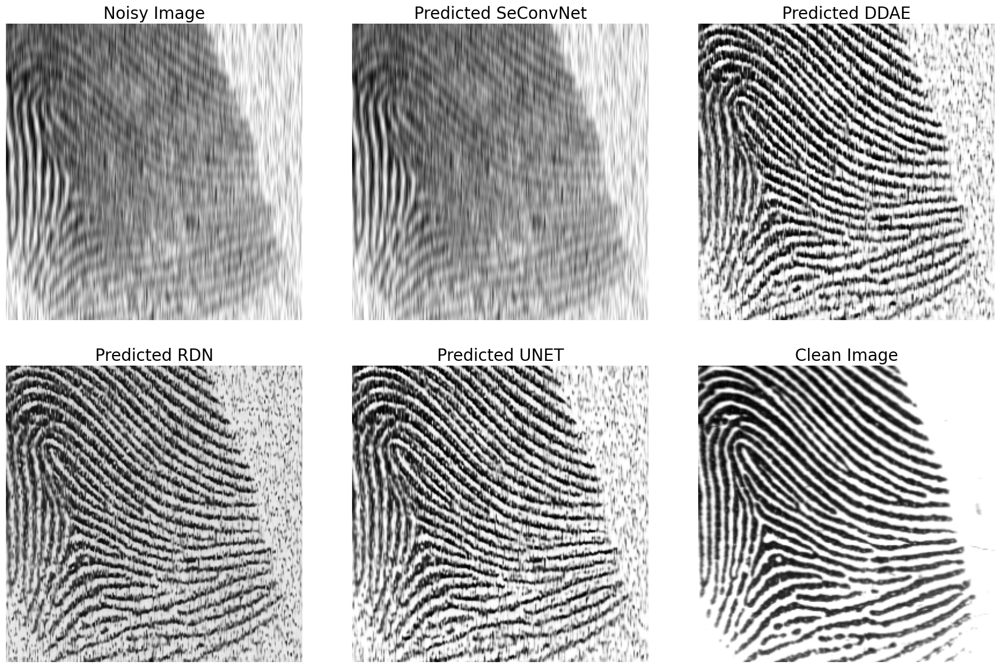

In [ ]:


# Seleziona un indice casuale dall'insieme esteso
index_to_display = np.random.randint(0, samples_noisy.shape[0])

# Estrai l'immagine rumorosa e corrispondente pulita usando l'indice casuale
test_image_noisy = samples_noisy[index_to_display:index_to_display+1]  # Mantieni la dimensione del batch
test_image_clean = samples_clean[index_to_display:index_to_display+1]

# Effettua una predizione sull'immagine selezionata
predicted_rdn = RDN_B.predict(test_image_noisy).squeeze()
predicted_ddae = DDAE_B.predict(test_image_noisy).squeeze()
predicted_unet = UNET_B.predict(test_image_noisy).squeeze()
predicted_seconv = SCNET_B.predict(test_image_noisy).squeeze()

# Prepara le immagini per la visualizzazione
test_image_clean_vis = test_image_clean.squeeze()
test_image_noisy_vis = test_image_noisy.squeeze()
#predicted_image_vis = predicted_image.squeeze()

# Visualizza i risultati usando la tua funzione di plotting
plot_fp(img=[test_image_noisy_vis, predicted_seconv, predicted_ddae, predicted_rdn, predicted_unet, test_image_clean_vis],
        name=["Noisy Image", "Predicted SeConvNet", "Predicted DDAE", "Predicted RDN", "Predicted UNET", "Clean Image"],
        save_path = "/content/drive/MyDrive/fingerprints/results/mixed.png")

Immagine salvata in /content/drive/MyDrive/fingerprints/results/mixed_comp.png


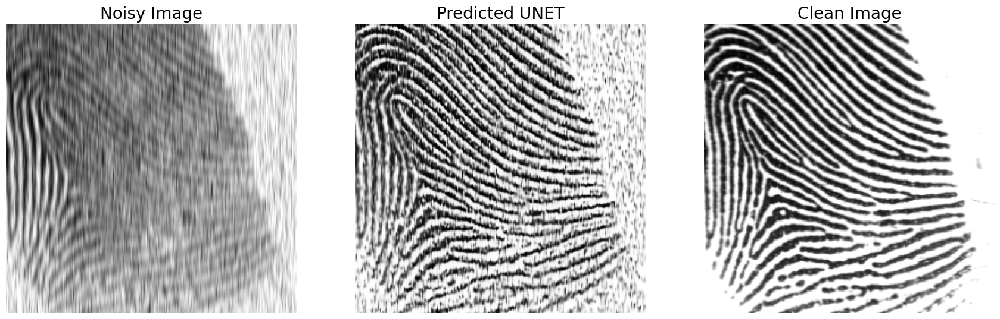

In [ ]:
plot_fp(img=[test_image_noisy_vis, test_image_clean_vis],
        name=["Noisy Image", "Clean Image"],
        save_path = "/content/drive/MyDrive/fingerprints/results/mixed_comp.png",max_righe = 3)

Immagine salvata in /content/drive/MyDrive/fingerprints/results/noiz_blurred.png


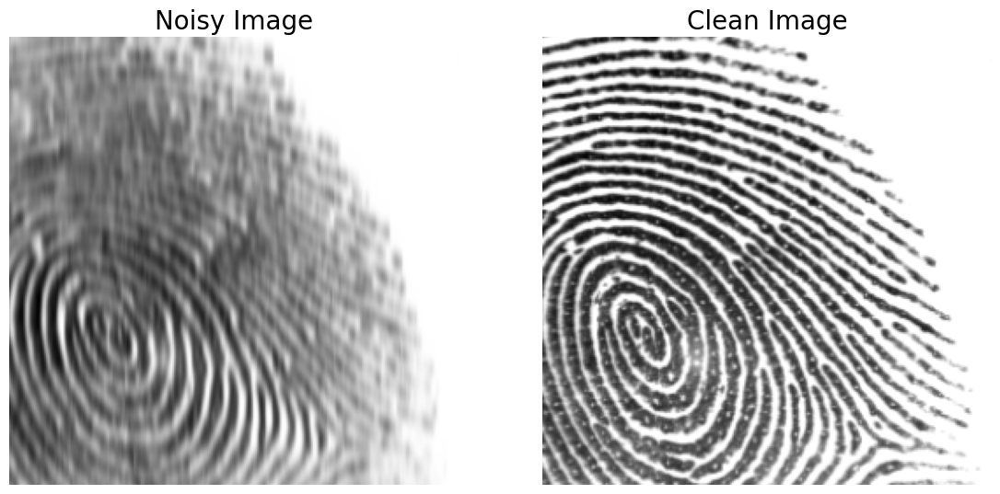

In [ ]:

# Seleziona un indice casuale dall'insieme esteso
index_to_display = np.random.randint(0, samples_noisy.shape[0])

# Estrai l'immagine rumorosa e corrispondente pulita usando l'indice casuale
test_image_noisy = samples_noisy[index_to_display:index_to_display+1]  # Mantieni la dimensione del batch
test_image_clean = samples_clean[index_to_display:index_to_display+1]

# Prepara le immagini per la visualizzazione
test_image_clean_vis = test_image_clean.squeeze()
test_image_noisy_vis = test_image_noisy.squeeze()

plot_fp(img=[test_image_noisy_vis, test_image_clean_vis],
        name=["Noisy Image", "Clean Image"],
        save_path = "/content/drive/MyDrive/fingerprints/results/noiz_blurred.png",max_righe = 2)

##Tensorboard

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/fingerprints/training

Reusing TensorBoard on port 6006 (pid 2632), started 0:27:09 ago. (Use '!kill 2632' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
def decode_tensor_content(tensor_content, dtype):
    if dtype == tf.float32:
        # Decodifica il contenuto del tensore come float32
        return np.frombuffer(tensor_content, dtype=np.float32)[0]
    # Aggiungi qui altri tipi di dati se necessario
    return None

def tflog2pandas(root_log_dir, out_path, nome_modello):
  # Inizializza una lista per mantenere i record
  records = []
  epochs_data = {}

  # Elenco dei tag di interesse
  tags_of_interest = ['loss', 'SSIM', 'PSNR']

  for sub_dir in ['test', 'train', 'validation']:
    log_dir = os.path.join(root_log_dir, sub_dir)
    for file in os.listdir(log_dir):
        if 'tfevents' in file:
            path = os.path.join(log_dir, file)
            for e in tf.compat.v1.train.summary_iterator(path):
                for v in e.summary.value:
                    if v.tag in tags_of_interest:
                        metric_value = decode_tensor_content(v.tensor.tensor_content, tf.float32)
                        key = (sub_dir, e.step)
                        if key not in epochs_data:
                            epochs_data[key] = {"Subdirectory": sub_dir, "Epoch": e.step}
                        epochs_data[key][v.tag] = metric_value

  # Converti il dizionario accumulato in un DataFrame di pandas
  df = pd.DataFrame(epochs_data.values())

  # Se desideri ordinare il DataFrame per Subdirectory e Epoch
  df.sort_values(by=["Subdirectory", "Epoch"], inplace=True)

  # Esporta il DataFrame in un file CSV
  name = nome_modello + '.csv'
  csv_file = os.path.join(out_path, name)
  df.to_csv(csv_file, index=False)

In [ ]:
path="/content/drive/MyDrive/callbacks/UNET_20240312_212119/logs" #folderpath
tflog2pandas(path, '/content/drive/MyDrive/trained/CSV', 'UNET')
#df=df[(df.metric != 'params/lr')&(df.metric != 'params/mm')&(df.metric != 'train/loss')] #delete the mentioned rows

Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`


In [ ]:
tensorboard dev export --logdir /content/drive/MyDrive/callbacks/ADVDAE_20240307_192226/logs --output_file /content/drive/MyDrive/trained/ADVDAE_20240308_052557/your_data.csv

ERROR: Failed to launch TensorBoard (exited with 2).
Contents of stderr:
2024-03-12 15:22:29.548663: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-12 15:22:29.548788: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-12 15:22:29.550260: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-12 15:22:30.529213: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
usage: tensorboard [-h] [--helpfull] {serve,dev} ...
tensorboard: error: unrecognized arguments: --logdir /content/drive/MyDrive/callbacks/ADVDAE_20240307_192226/logs -